# Neural Network Training for Proposal Logs

This notebook outlines the process of training a Multi-Layer Perceptron (MLP) to predict outputs based on input data from `proposal_logs_2.h5`. The process includes:
1. Defining constants.
2. Loading and preprocessing the data (normalization).
3. Preparing PyTorch datasets and dataloaders.
4. Defining the MLP model architecture.
5. Setting up the optimizer, loss function, and learning rate scheduler.
6. Training the model and evaluating its performance on a test set.
7. Plotting training and validation loss.

In [1]:
# Import necessary libraries
import h5py
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define Constants

This cell defines all the constants used throughout the notebook, such as file paths, training parameters, and model configurations.

In [2]:
# Data and Model Constants
HDF5_FILE_PATH = 'proposal_logs_2.h5'
INPUT_DATASET_NAME = 'inputs'
OUTPUT_DATASET_NAME = 'outputs'
OUTPUT_NORMALIZATION_FACTOR = 275.0
TEST_SET_FRACTION = 0.1
RANDOM_STATE_SPLIT = 42 # For reproducible train/test splits

# Training Constants
BATCH_SIZE = 64
LEARNING_RATE = 1e-3
EPOCHS = 400000 # Adjust as needed
LR_SCHEDULER_PATIENCE = 400 # Patience for ReduceLROnPlateau
LR_SCHEDULER_FACTOR = 0.75 # Factor for ReduceLROnPlateau

# Model Configuration
# Example: [256, 128] means two hidden layers with 256 and 128 neurons respectively
HIDDEN_SIZES = [16, 32, 64, 128, 128, 128]

# Determine device
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

Using device: cuda


# Load Data from HDF5

Load the `inputs` and `outputs` datasets from the specified HDF5 file.

In [3]:
# Load data from HDF5 file
try:
    with h5py.File(HDF5_FILE_PATH, 'r') as f:
        inputs_matrix = f[INPUT_DATASET_NAME][:]
        outputs_matrix = f[OUTPUT_DATASET_NAME][:]
    print(f"Inputs shape: {inputs_matrix.shape}")
    print(f"Outputs shape: {outputs_matrix.shape}")
except Exception as e:
    print(f"Error loading HDF5 file: {e}")
    # Fallback or error handling
    inputs_matrix, outputs_matrix = np.array([]), np.array([]) # Ensure they exist

if inputs_matrix.size == 0 or outputs_matrix.size == 0:
    print("Data loading failed or resulted in empty arrays. Please check HDF5 file and dataset names.")
else:
    print("Data loaded successfully.")

Inputs shape: (102111, 8)
Outputs shape: (102111, 52)
Data loaded successfully.


# Normalize Data

Normalize the input and output data.
- **Inputs**: Normalized per entry (row-wise) by subtracting the mean and dividing by the standard deviation of that entry. A small epsilon is added to the standard deviation to prevent division by zero.
- **Outputs**: Normalized by dividing all values by a constant factor (275).

In [4]:
# Normalize inputs (per entry: (x - mean(x_row)) / std(x_row))
if inputs_matrix.size > 0:
    mean_inputs = np.mean(inputs_matrix, axis=0, keepdims=True)
    std_inputs = np.std(inputs_matrix, axis=0, keepdims=True)
    inputs_normalized = (inputs_matrix - mean_inputs) / (std_inputs)
    print("Inputs normalized.")
    print(f"Shape of normalized inputs: {inputs_normalized.shape}")
else:
    inputs_normalized = np.array([])
    print("Inputs matrix is empty, skipping normalization.")

# Normalize outputs (divide by a constant factor)
if outputs_matrix.size > 0:
    outputs_normalized = outputs_matrix / OUTPUT_NORMALIZATION_FACTOR
    print("Outputs normalized.")
    print(f"Shape of normalized outputs: {outputs_normalized.shape}")
else:
    outputs_normalized = np.array([])
    print("Outputs matrix is empty, skipping normalization.")

Inputs normalized.
Shape of normalized inputs: (102111, 8)
Outputs normalized.
Shape of normalized outputs: (102111, 52)


In [5]:
# Load data from v1_h1_data.h5 into variable 'reference'
try:
    with h5py.File('v1_h1_data.h5', 'r') as ref_file:
        reference = {key: ref_file[key][:] for key in ref_file.keys()}
    print("Loaded datasets from 'v1_h1_data.h5':", list(reference.keys()))
except Exception as e:
    print(f"Error loading 'v1_h1_data.h5': {e}")
    reference = {}

reference = reference['v1_h1']
reference = reference / OUTPUT_NORMALIZATION_FACTOR

Loaded datasets from 'v1_h1_data.h5': ['v1_h1']


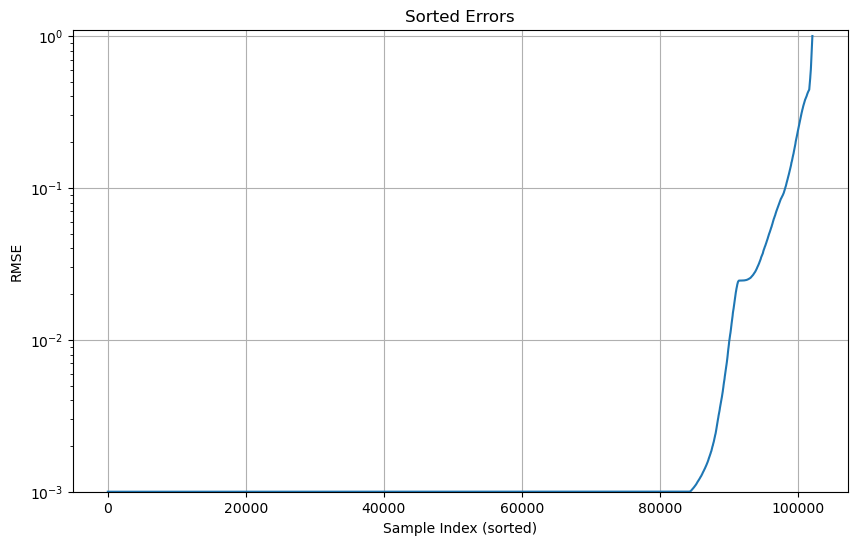

In [6]:
errors = np.exp(-(np.sum((np.abs(outputs_normalized - reference)**2), axis=1)) / 10)
errors = errors / np.max(errors)
errors[errors < 1e-3] = 1e-3
sorted_errors = np.sort(errors)

plt.figure(figsize=(10, 6))
plt.plot(sorted_errors)
plt.title('Sorted Errors')
plt.xlabel('Sample Index (sorted)')
plt.ylabel('RMSE')
plt.yscale('log')
plt.ylim([1e-3, 1.1e0])
plt.grid(True)
plt.show()

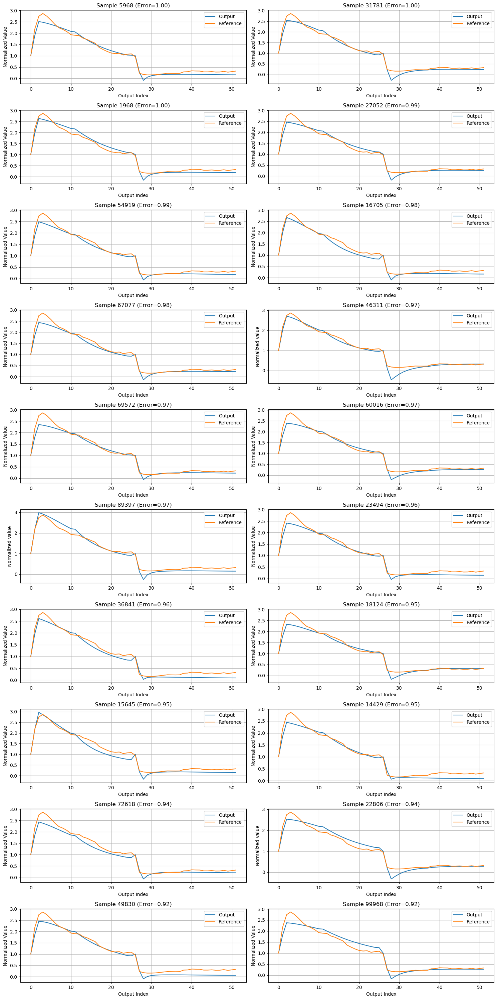

In [7]:
# Find indices with smallest errors (e.g., 10 smallest)
n_samples = 20
best_indices = np.argsort(errors)[-n_samples:][::-1]

plt.figure(figsize=(15, 30))
for i, idx in enumerate(best_indices):
    plt.subplot(10, 2, i + 1)
    plt.plot(outputs_normalized[idx], label='Output')
    plt.plot(reference, label='Reference')
    plt.title(f'Sample {idx} (Error={errors[idx]:.2f})')
    plt.xlabel('Output Index')
    plt.ylabel('Normalized Value')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

In [8]:
mask = errors > 1e-3
outputs_normalized = outputs_normalized[mask]
inputs_normalized = inputs_normalized[mask]
errors = errors[mask] * 0 + 1

# Prepare Data for PyTorch

Convert the NumPy arrays to PyTorch tensors. Then, split the data into training and testing sets. Finally, create `TensorDataset` and `DataLoader` objects for efficient batch processing during training and evaluation.

In [9]:
# Example usage:
# Convert errors (numpy array) to torch tensor on DEVICE
sample_weights = torch.tensor(errors, dtype=torch.float32)


def weighted_l1_loss(predictions, targets, sample_weights):
    abs_diff = torch.abs(predictions - targets)
    weighted = abs_diff * sample_weights.view(-1, 1)
    return weighted.mean()


def weighted_mse_loss(predictions, targets, sample_weights):
    sq_diff = (predictions - targets) ** 2
    weighted = sq_diff * sample_weights.view(-1, 1)
    return weighted.mean()

In [10]:
if inputs_normalized.size > 0 and outputs_normalized.size > 0:
    # Convert to PyTorch tensors
    inputs_tensor = torch.tensor(inputs_normalized, dtype=torch.float32)
    outputs_tensor = torch.tensor(outputs_normalized, dtype=torch.float32)

    # Split data into training and testing sets
    inputs_train, inputs_test, outputs_train, outputs_test, weights_train, weights_test = train_test_split(
        inputs_tensor, outputs_tensor, sample_weights, test_size=TEST_SET_FRACTION, random_state=RANDOM_STATE_SPLIT
    )

    print(f"Training inputs shape: {inputs_train.shape}")
    print(f"Training outputs shape: {outputs_train.shape}")
    print(f"Test inputs shape: {inputs_test.shape}")
    print(f"Test outputs shape: {outputs_test.shape}")

    # Create TensorDatasets
    train_dataset = TensorDataset(inputs_train, outputs_train, weights_train)
    test_dataset = TensorDataset(inputs_test, outputs_test, weights_test)

    # Create DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

    print("DataLoaders created.")
else:
    print("Normalized data is empty. Skipping PyTorch data preparation.")
    # Create empty loaders to prevent errors later if accessed
    train_loader, test_loader = None, None

Training inputs shape: torch.Size([15956, 8])
Training outputs shape: torch.Size([15956, 52])
Test inputs shape: torch.Size([1773, 8])
Test outputs shape: torch.Size([1773, 52])
DataLoaders created.


# Define MLP Model

Define the Multi-Layer Perceptron (MLP) model using PyTorch's `nn.Module`. The model architecture is flexible, allowing for a configurable number of hidden layers and neurons per layer, using Tanh activation functions. The final layer is a linear layer to produce the output.

In [11]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size):
        super(MLP, self).__init__()
        layers = []
        current_size = input_size
        for hidden_size in hidden_sizes:
            layers.append(nn.Linear(current_size, hidden_size))
            layers.append(nn.Tanh())
            current_size = hidden_size
        layers.append(nn.Linear(current_size, output_size))
        
        self.network = nn.Sequential(*layers)

    def forward(self, x):
        return self.network(x)

if 'inputs_train' in globals() and 'outputs_train' in globals() and inputs_train.nelement() > 0 and outputs_train.nelement() > 0:
    # Determine input and output sizes from the data
    input_features = inputs_train.shape[1]
    output_features = outputs_train.shape[1]

    # Instantiate the model
    model = MLP(input_size=input_features, hidden_sizes=HIDDEN_SIZES, output_size=output_features)
    model.to(DEVICE) # Move model to the selected device (GPU or CPU)
    print("MLP model defined and instantiated:")
    print(model)
else:
    model = None # Ensure model is None if data is not available
    print("Cannot instantiate model as training data is not available or empty.")

MLP model defined and instantiated:
MLP(
  (network): Sequential(
    (0): Linear(in_features=8, out_features=16, bias=True)
    (1): Tanh()
    (2): Linear(in_features=16, out_features=32, bias=True)
    (3): Tanh()
    (4): Linear(in_features=32, out_features=64, bias=True)
    (5): Tanh()
    (6): Linear(in_features=64, out_features=128, bias=True)
    (7): Tanh()
    (8): Linear(in_features=128, out_features=128, bias=True)
    (9): Tanh()
    (10): Linear(in_features=128, out_features=128, bias=True)
    (11): Tanh()
    (12): Linear(in_features=128, out_features=52, bias=True)
  )
)


# Training Setup: Loss Function, Optimizer, and Scheduler

Set up the components required for training the model:
- **Loss Function**: L1 Loss (Mean Absolute Error), suitable for regression tasks where robustness to outliers might be desired.
- **Optimizer**: Adam optimizer, an adaptive learning rate optimization algorithm.
- **Learning Rate Scheduler**: `ReduceLROnPlateau`, which reduces the learning rate when a metric (e.g., validation loss) has stopped improving.

In [12]:
if model: # Proceed only if model was instantiated
    # Loss function
    criterion = nn.L1Loss()
    # criterion = nn.MSELoss() # Mean Squared Error Loss
    # criterion = weighted_mse_loss # Custom loss function
    # criterion = weighted_l1_loss # Custom loss function

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # Learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, 
        mode='min', # Reduce LR when the monitored quantity stops decreasing
        factor=LR_SCHEDULER_FACTOR, 
        patience=LR_SCHEDULER_PATIENCE
    )
    print("Loss function, optimizer, and LR scheduler defined.")
else:
    criterion, optimizer, scheduler = None, None, None
    print("Skipping training setup as model is not available.")

Loss function, optimizer, and LR scheduler defined.


# Training Loop

This section implements the training loop for the MLP model. For each epoch, the model iterates over the training data in batches, computes the loss, performs backpropagation, and updates the model weights. After each epoch, the model is evaluated on the test set to monitor performance and adjust the learning rate if necessary. Training and test losses are collected for later visualization.

In [13]:
if model and train_loader and test_loader and criterion and optimizer and scheduler:
    train_losses = []
    test_losses = []

    print("Starting training...")
    for epoch in range(EPOCHS):
        model.train()  # Set model to training mode
        running_train_loss = 0.0
        for batch_inputs, batch_outputs, batch_weights in train_loader:
            batch_inputs, batch_outputs, batch_weights = batch_inputs.to(DEVICE), batch_outputs.to(DEVICE), batch_weights.to(DEVICE)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            predictions = model(batch_inputs)
            # loss = criterion(predictions, batch_outputs, batch_weights)
            loss = criterion(predictions, batch_outputs)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            running_train_loss += loss.item() * batch_inputs.size(0)
        
        epoch_train_loss = running_train_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)

        # Validation phase
        model.eval()  # Set model to evaluation mode
        running_test_loss = 0.0
        with torch.no_grad(): # Disable gradient calculations
            for batch_inputs, batch_outputs, batch_weights in test_loader:
                batch_inputs, batch_outputs, batch_weights = batch_inputs.to(
                    DEVICE), batch_outputs.to(DEVICE), batch_weights.to(DEVICE)
                predictions = model(batch_inputs)
                # loss = criterion(predictions, batch_outputs, batch_weights)
                loss = criterion(predictions, batch_outputs)
                running_test_loss += loss.item() * batch_inputs.size(0)
        
        epoch_test_loss = running_test_loss / len(test_loader.dataset)
        test_losses.append(epoch_test_loss)

        # Adjust learning rate
        scheduler.step(epoch_train_loss)
        
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Epoch [{epoch+1}/{EPOCHS}], Train Loss: {epoch_train_loss:.6f}, Test Loss: {epoch_test_loss:.6f}, LR: {current_lr:.6e}")

    print("Training finished.")
else:
    train_losses, test_losses = [], [] # Ensure lists exist
    print("Skipping training loop as model or data loaders are not available, or criterion/optimizer/scheduler is missing.")

Starting training...
Epoch [1/400000], Train Loss: 0.282472, Test Loss: 0.192268, LR: 1.000000e-03
Epoch [2/400000], Train Loss: 0.171548, Test Loss: 0.144125, LR: 1.000000e-03
Epoch [3/400000], Train Loss: 0.141297, Test Loss: 0.132245, LR: 1.000000e-03
Epoch [4/400000], Train Loss: 0.125717, Test Loss: 0.129923, LR: 1.000000e-03
Epoch [5/400000], Train Loss: 0.114518, Test Loss: 0.106037, LR: 1.000000e-03
Epoch [6/400000], Train Loss: 0.106769, Test Loss: 0.099453, LR: 1.000000e-03
Epoch [7/400000], Train Loss: 0.099536, Test Loss: 0.097408, LR: 1.000000e-03
Epoch [8/400000], Train Loss: 0.093164, Test Loss: 0.098068, LR: 1.000000e-03
Epoch [9/400000], Train Loss: 0.087483, Test Loss: 0.094000, LR: 1.000000e-03
Epoch [10/400000], Train Loss: 0.080574, Test Loss: 0.080069, LR: 1.000000e-03
Epoch [11/400000], Train Loss: 0.071675, Test Loss: 0.071803, LR: 1.000000e-03
Epoch [12/400000], Train Loss: 0.067354, Test Loss: 0.061718, LR: 1.000000e-03
Epoch [13/400000], Train Loss: 0.062826,

KeyboardInterrupt: 

# Plot Training and Test Losses

Visualize the training and test losses collected over the epochs. This helps in understanding the model's learning progress and identifying potential issues like overfitting.

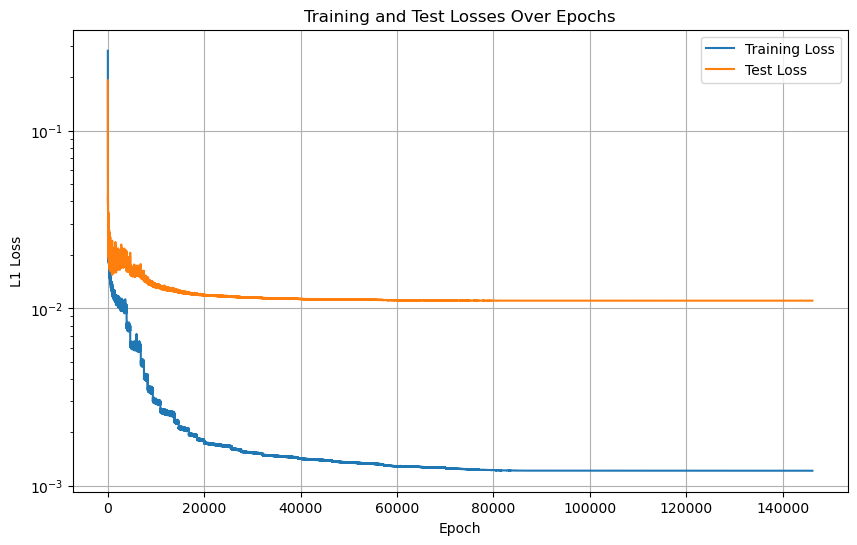

In [14]:
if train_losses and test_losses:
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.title('Training and Test Losses Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('L1 Loss')
    plt.yscale('log')  # Log scale for better visibility
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("No loss data to plot. Training might have been skipped or failed.")

In [15]:
# save trained network
if model:
    torch.save(model.state_dict(), 'trained_mode_teleskop3_1.pth')
    print("Model saved as 'trained_model.pth'")

Model saved as 'trained_model.pth'


In [ ]:
# Load the trained model from a saved .pth file
if model is not None:
    model.load_state_dict(torch.load('trained_mode_teleskop_2.pth', map_location=DEVICE))
    model.to(DEVICE)
    model.eval()
    print("Model loaded from 'trained_mode2_5.pth'")
else:
    print("Model instance not available. Please instantiate the model before loading weights.")

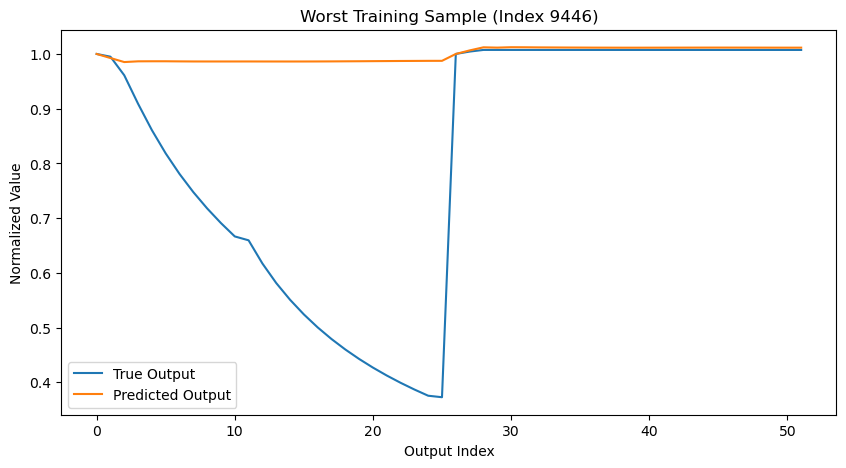

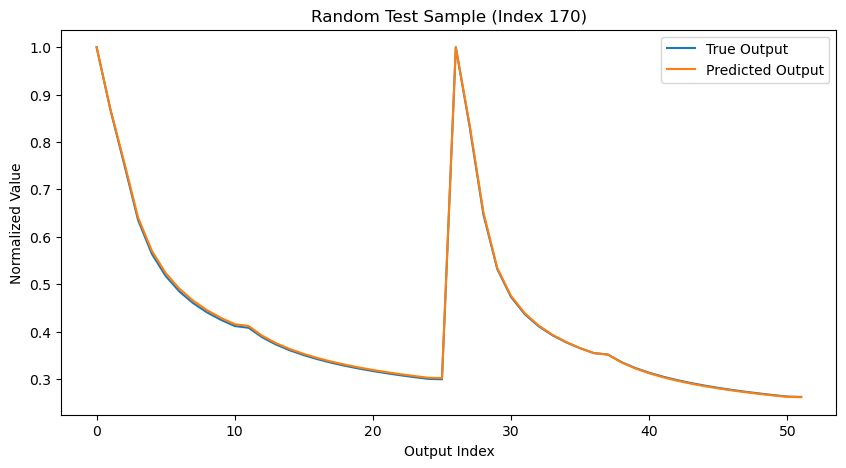

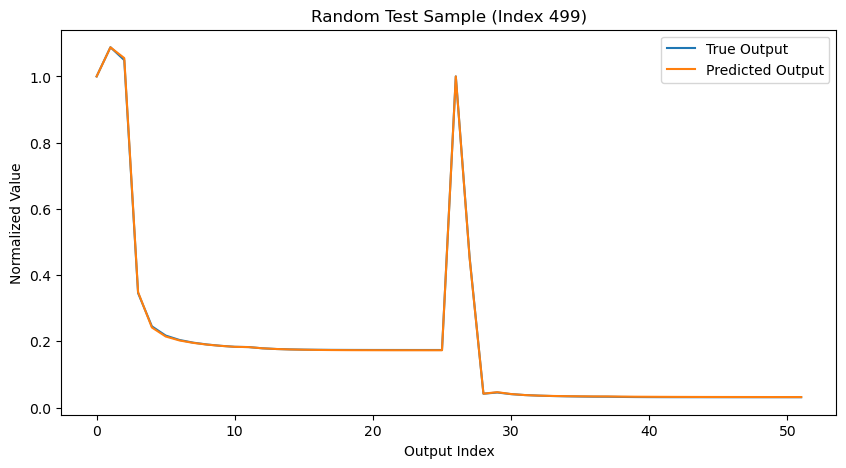

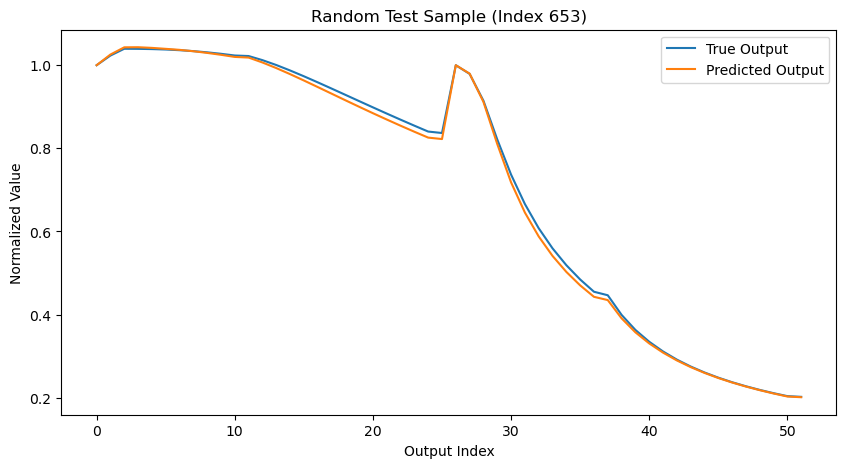

In [16]:
import random

# Find the worst training approximation (largest error)
if model and inputs_train is not None and outputs_train is not None:
    model.eval()
    with torch.no_grad():
        train_preds = model(inputs_train.to(DEVICE)).cpu()
        train_targets = outputs_train.cpu()
        errors = torch.mean((train_preds - train_targets).abs(), dim=1)
        worst_idx = torch.argmax(errors).item()

        # Plot worst training sample
        plt.figure(figsize=(10, 5))
        plt.plot(train_targets[worst_idx].numpy(), label='True Output')
        plt.plot(train_preds[worst_idx].numpy(), label='Predicted Output')
        plt.title(f'Worst Training Sample (Index {worst_idx})')
        plt.xlabel('Output Index')
        plt.ylabel('Normalized Value')
        plt.legend()
        plt.show()

    # Plot a few random test samples
    n_samples = 3
    test_indices = random.sample(range(len(inputs_test)), n_samples)
    with torch.no_grad():
        test_preds = model(inputs_test[test_indices].to(DEVICE)).cpu()
        test_targets = outputs_test[test_indices].cpu()
        for i, idx in enumerate(test_indices):
            plt.figure(figsize=(10, 5))
            plt.plot(test_targets[i].numpy(), label='True Output')
            plt.plot(test_preds[i].numpy(), label='Predicted Output')
            plt.title(f'Random Test Sample (Index {idx})')
            plt.xlabel('Output Index')
            plt.ylabel('Normalized Value')
            plt.legend()
            plt.show()
else:
    print("Model or data not available for plotting.")

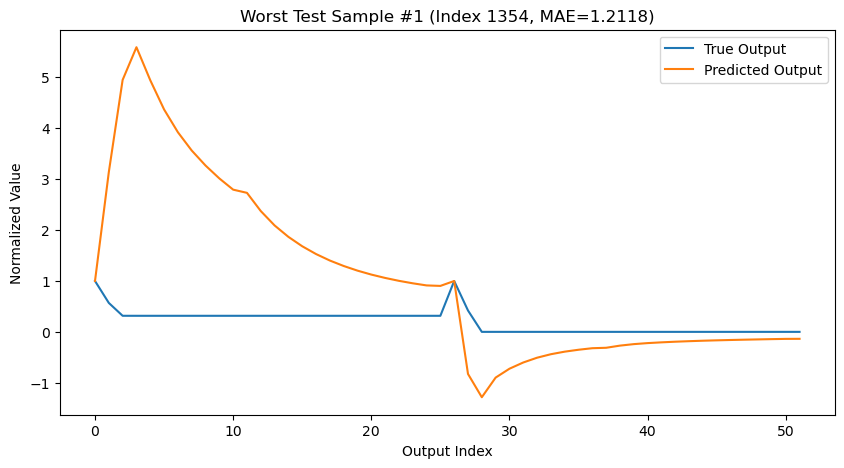

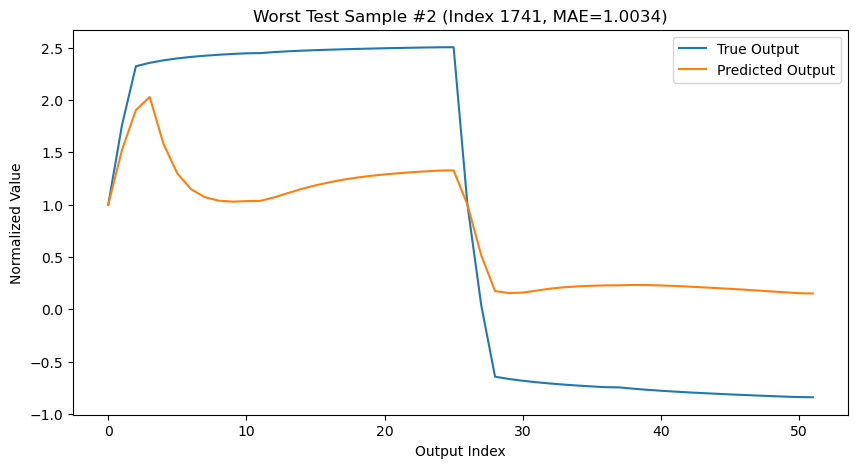

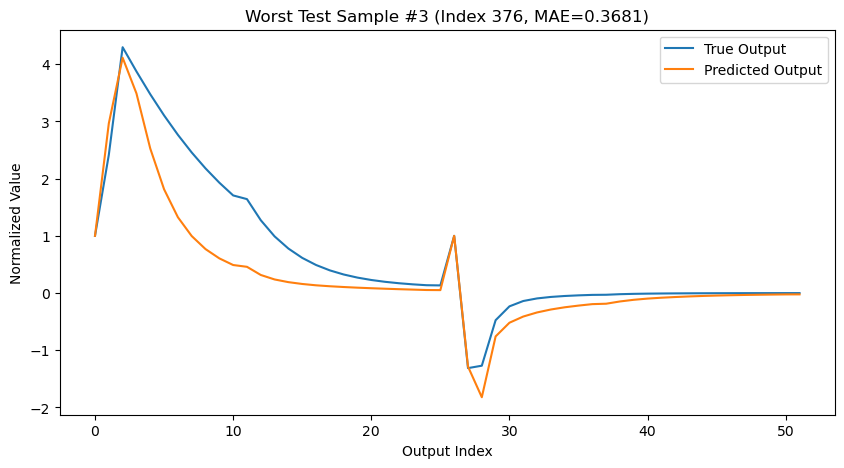

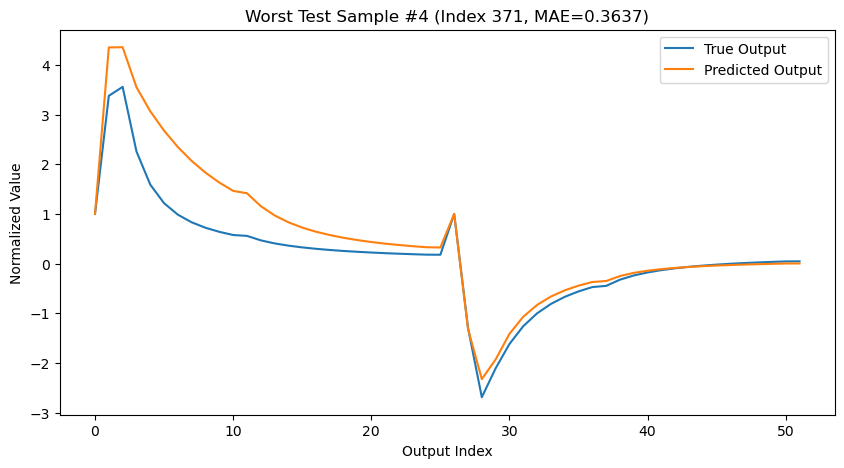

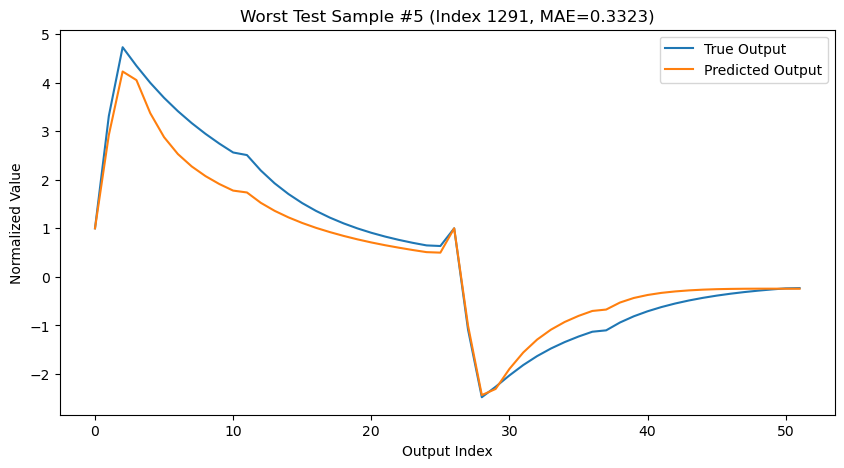

In [17]:
# Plot the five worst test samples (largest errors)
if model and inputs_test is not None and outputs_test is not None:
    model.eval()
    with torch.no_grad():
        test_preds_all = model(inputs_test.to(DEVICE)).cpu()
        test_targets_all = outputs_test.cpu()
        test_errors = torch.mean((test_preds_all - test_targets_all).abs(), dim=1)
        worst_test_indices = torch.topk(test_errors, 5).indices.numpy()

        for i, idx in enumerate(worst_test_indices):
            plt.figure(figsize=(10, 5))
            plt.plot(test_targets_all[idx].numpy(), label='True Output')
            plt.plot(test_preds_all[idx].numpy(), label='Predicted Output')
            plt.title(f'Worst Test Sample #{i+1} (Index {idx}, MAE={test_errors[idx]:.4f})')
            plt.xlabel('Output Index')
            plt.ylabel('Normalized Value')
            plt.legend()
            plt.show()
else:
    print("Model or test data not available for plotting.")

# Test the likelihood of the data vs the trained model

In [18]:
# Normalize inputs (per entry: (x - mean(x_row)) / std(x_row))
if inputs_matrix.size > 0:
    mean_inputs = np.mean(inputs_matrix, axis=0, keepdims=True)
    std_inputs = np.std(inputs_matrix, axis=0, keepdims=True)
    inputs_normalized = (inputs_matrix - mean_inputs) / (std_inputs)
    print("Inputs normalized.")
    print(f"Shape of normalized inputs: {inputs_normalized.shape}")
else:
    inputs_normalized = np.array([])
    print("Inputs matrix is empty, skipping normalization.")

# Normalize outputs (divide by a constant factor)
if outputs_matrix.size > 0:
    outputs_normalized = outputs_matrix / OUTPUT_NORMALIZATION_FACTOR
    print("Outputs normalized.")
    print(f"Shape of normalized outputs: {outputs_normalized.shape}")
else:
    outputs_normalized = np.array([])
    print("Outputs matrix is empty, skipping normalization.")

Inputs normalized.
Shape of normalized inputs: (102111, 8)
Outputs normalized.
Shape of normalized outputs: (102111, 52)


In [20]:
inputs_tensor = torch.tensor(inputs_normalized, dtype=torch.float32)

# Compute predictions for all normalized inputs using the trained model
if model is not None and inputs_tensor is not None:
    model.eval()
    with torch.no_grad():
        all_preds = model(inputs_tensor.to(DEVICE)).cpu().numpy()
    print("Predictions for all normalized inputs computed. Shape:", all_preds.shape)
else:
    print("Model or inputs_tensor not available.")

Predictions for all normalized inputs computed. Shape: (102111, 52)


In [21]:
errors_true = -(np.sum((np.abs(outputs_normalized - reference)**2), axis=1))
errors_predicted = -(np.sum((np.abs(all_preds - reference)**2), axis=1))

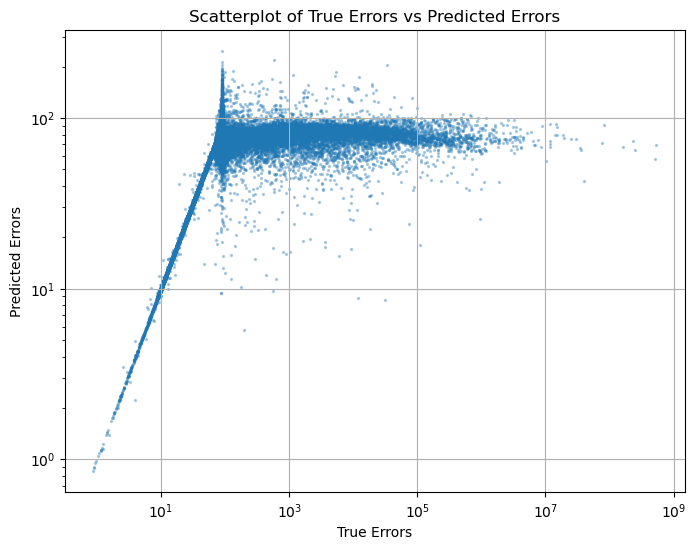

In [24]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(-errors_true, -errors_predicted, alpha=0.3, s=2)
plt.xlabel('True Errors')
plt.ylabel('Predicted Errors')
plt.title('Scatterplot of True Errors vs Predicted Errors')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.show()

# Save the model to cpu and then to disk, write also yaml file with the model parameters for easy loading


In [25]:
import torch
import yaml
import torch
import yaml

# 1. Move model to CPU and save state_dict
if model is not None:
    model_cpu = model.to('cpu')
    model_path = 'trained_model_cpu.pth'
    torch.save(model_cpu.state_dict(), model_path)
    print(f"Model saved to {model_path}")

    # 2. Save model parameters to YAML
    model_params = {
        'input_size': input_features,
        'hidden_sizes': HIDDEN_SIZES,
        'output_size': output_features,
        'state_dict_path': model_path
    }
    yaml_path = 'trained_model_cpu.yaml'
    with open(yaml_path, 'w') as f:
        yaml.dump(model_params, f)
    print(f"Model parameters saved to {yaml_path}")
else:
    print("Model is not available.")

Model saved to trained_model_cpu.pth
Model parameters saved to trained_model_cpu.yaml


In [26]:
# 3. Provide a loading function
def load_mlp_from_yaml(yaml_file):

    with open(yaml_file, 'r') as f:
        params = yaml.safe_load(f)
    class MLP(torch.nn.Module):
        def __init__(self, input_size, hidden_sizes, output_size):
            super().__init__()
            layers = []
            current_size = input_size
            for hidden_size in hidden_sizes:
                layers.append(torch.nn.Linear(current_size, hidden_size))
                layers.append(torch.nn.Tanh())
                current_size = hidden_size
            layers.append(torch.nn.Linear(current_size, output_size))
            self.network = torch.nn.Sequential(*layers)
        def forward(self, x):
            return self.network(x)
    model = MLP(params['input_size'], params['hidden_sizes'], params['output_size'])
    model.load_state_dict(torch.load(params['state_dict_path'], map_location='cpu'))
    model.eval()
    return model

# Example usage
loaded_model = load_mlp_from_yaml('trained_model_cpu.yaml')
print("Model loaded from YAML file.")

Model loaded from YAML file.
